In [7]:
import numpy as np
import os, sys, librosa
import pandas as pd
from scipy import signal
import matplotlib.pyplot as plt
from scipy.io.wavfile import read as wavread
from scipy.io.wavfile import write
from matplotlib import pyplot as plt
import IPython.display as ipd
import libfmp.b
import math
from scipy.ndimage import median_filter
from scipy.interpolate import interp1d
from scipy.ndimage import filters

In [8]:
path = 'C:/Users/thiag/Documents/Github/melograph/Audios/WholeToneWurl.wav'

In [9]:
write('AUDIO.wav', 44100,x)
import IPython.display as ipd
ipd.Audio('AUDIO.wav')

### Helper Functions

In [10]:
def ToolReadAudio(cAudioFilePath):
    [samplerate, x] = wavread(cAudioFilePath)

    if x.dtype == 'float32':
        audio = x
    else:
        # change range to [-1,1)
        if x.dtype == 'uint8':
            nbits = 8
        elif x.dtype == 'int16':
            nbits = 16
        elif x.dtype == 'int32':
            nbits = 32

        audio = x / float(2 ** (nbits - 1))

    # special case of unsigned format
    if x.dtype == 'uint8':
        audio = audio - 1.

    return samplerate, audio
def compute_spectrogram(xb):
    numBlocks = xb.shape[0]
    afWindow = compute_hann(xb.shape[1])
    X = np.zeros([math.ceil(xb.shape[1]/2+1), numBlocks])

    for n in range(0, numBlocks):
        # apply window
        tmp = abs(np.fft.fft(xb[n,:] * afWindow))*2/xb.shape[1]

        # compute magnitude spectrum
        X[:,n] = tmp[range(math.ceil(tmp.size/2+1))]
        X[[0, math.ceil(tmp.size/2)],n]= X[[0,math.ceil(tmp.size/2)],n]/np.sqrt(2)
        #let's be pedantic about normalization
    return X
def block_audio(x,blockSize,hopSize,fs):
    # allocate memory
    numBlocks = math.ceil(x.size / hopSize)
    xb = np.zeros([numBlocks, blockSize])
    # compute time stamps
    t = (np.arange(0, numBlocks) * hopSize) / fs
    x = np.concatenate((x, np.zeros(blockSize)),axis=0)
    for n in range(0, numBlocks):
        i_start = n * hopSize
        i_stop = np.min([x.size - 1, i_start + blockSize - 1])
        xb[n][np.arange(0,blockSize)] = x[np.arange(i_start, i_stop + 1)]
    return (xb,t)
def compute_hann(iWindowLength):
    return 0.5 - (0.5 * np.cos(2 * np.pi / iWindowLength * np.arange(iWindowLength)))

In [11]:
fs,x = ToolReadAudio(path)

## Energy based Novelty

In [12]:
N = 2048
w = signal.hann(N)


In [13]:
x_square = x**2
energy_local = np.convolve(x_square, w**2, 'same')

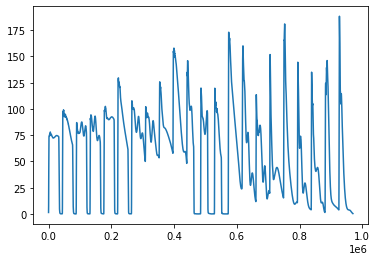

In [14]:
plt.plot(energy_local)

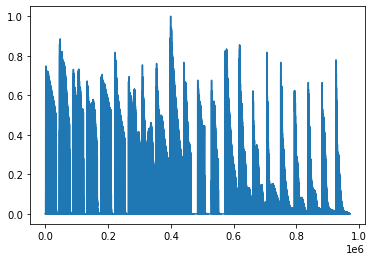

In [15]:
plt.plot(x_square)

In [16]:
energy_local_diff = np.diff(energy_local)
energy_local_diff = np.concatenate((energy_local_diff, np.array([0])))
novelty_energy = np.copy(energy_local_diff)
novelty_energy[energy_local_diff < 0] = 0

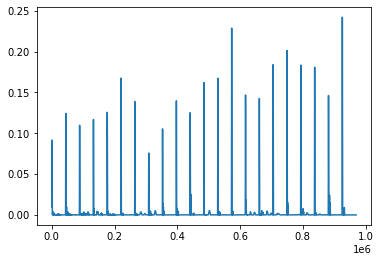

In [17]:
plt.plot(novelty_energy)

In [18]:
#gamma (float): Parameter for logarithmic compression (Default value = 10.0)
H = 128    
w = signal.hann(N)
Fs_feature = fs / H
energy_local = np.convolve(x**2, w**2, 'same')
energy_local = energy_local[::H]
energy_local = np.log(1 + 100 * energy_local)
energy_local_diff = np.diff(energy_local)
energy_local_diff = np.concatenate((energy_local_diff, np.array([0])))
novelty_energy = np.copy(energy_local_diff)
novelty_energy[energy_local_diff < 0] = 0
novelty_energy = novelty_energy / max(novelty_energy)


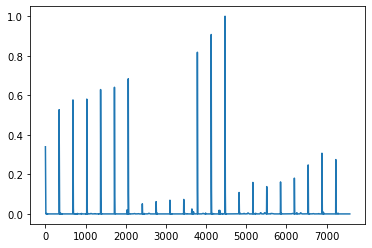

In [19]:
plt.plot(novelty_energy)

## Spectral Based Novelty

In [20]:
xb, t = block_audio(x,1024,256,fs)
X = compute_spectrogram(xb)
fInHz = np.arange(0, 1024, dtype=int)*fs/1024

In [21]:
t.shape

(3790,)

In [22]:
Y1 = np.log(1 + 1 * np.abs(X))
Y2 = np.log(1 + 100 * np.abs(X))

In [23]:
f, t, Zxx = signal.spectrogram(x, fs,'hann', nperseg=1024)

In [24]:
Y1 = np.log(1 + 100 * np.abs(Zxx))

(0.0, 1000.0)

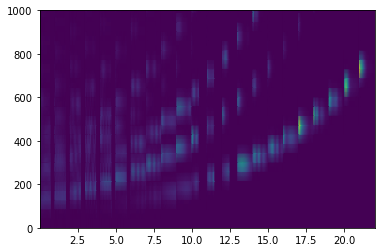

In [25]:
plt.pcolormesh(t, f, Y1, shading='gouraud')
plt.ylim(0,1000)

In [27]:
Y_diff = np.diff(Y1, n=1)
Y_diff[Y_diff < 0] = 0
nov = np.sum(Y_diff, axis=0)
nov = np.concatenate((nov, np.array([0])))

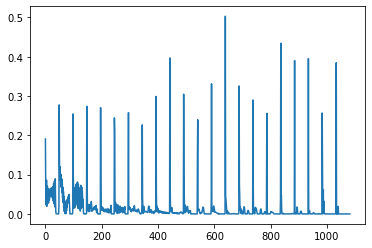

In [28]:
plt.plot(nov)

In [29]:
Fs_nov = fs/256

In [30]:
def local_average(x,M):
    L = len(x)
    local_average = np.zeros(L)
    for m in range(L):
        a = max(m - M, 0)
        b = min(m + M + 1, L)
        local_average[m] = (1 / (2 * M + 1)) * np.sum(x[a:b])
    return local_average

M_sec = 0.1
M = int(np.ceil(M_sec * Fs_nov))

local_average = local_average(nov, M)
nov_norm =  nov - local_average
nov_norm[nov_norm<0]=0
nov_norm = nov_norm / max(nov_norm)


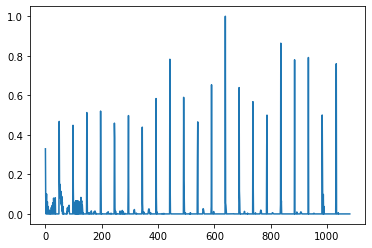

In [31]:
plt.plot(nov_norm)

In [32]:
def HPSS(x,fs):
    f, t, Zxx = signal.spectrogram(x, fs,'hann', nperseg=1024)
    win_harm =31 #Horizontal
    win_perc = 31 #Vertical
    harm = np.empty_like(Zxx)
    harm[:] = median_filter(Zxx, size=(1,win_harm ), mode='reflect')
    perc = np.empty_like(Zxx)
    perc[:] = median_filter(Zxx, size=(win_perc, 1), mode='reflect')
    X = np.greater(harm,perc)
    Xy = np.greater(perc,harm)
    Mx = np.empty_like(harm)
    Mx = np.where(X==True,1,0)
    My = np.where(Xy==True,1,0)
    Zxx_harm = Mx*Zxx
    Zxx_perc = My*Zxx
    y, xrec = signal.istft(Zxx_perc, fs)
    xrec=xrec/max(xrec)
    scale_factor= x.size/xrec.size
    return Zxx_perc,xrec

In [33]:
form = HPSS(x,fs)

In [34]:
scale_factor = x.size/form[1].size

In [35]:
Y1 = np.log(1 + 100 * np.abs(form[0]))
Y1.size
form[0].size

555066

In [36]:
Y_diff = np.diff(Y1, n=1)
Y_diff[Y_diff < 0] = 0
nov = np.sum(Y_diff, axis=0)
nov = np.concatenate((nov, np.array([0])))
nov = nov/max(nov)

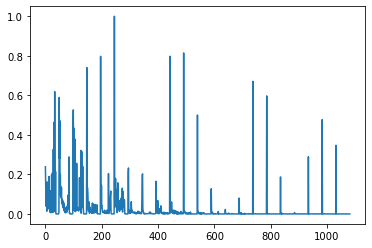

In [37]:
plt.plot(nov)

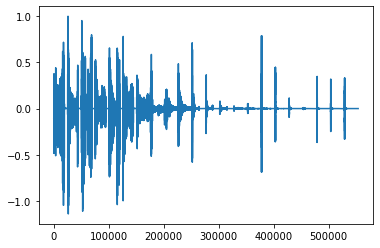

In [38]:
Y_diff = np.diff(form[1], n=1)
Y_diff[Y_diff < 0] = 0
#nov = np.sum(Y_diff, axis=0)
nov = np.concatenate((Y_diff, np.array([0])))
nov = nov/max(nov)
plt.plot(form[1])

In [39]:
    """
    Arguments:
        median_len (int): Length of media filter used for adaptive thresholding (Default value = 16)
        offset_rel (float): Additional offset used for adaptive thresholding (Default value = 0.05)
        sigma (float): Variance for Gaussian kernel used for smoothing the novelty function (Default value = 4.0)

    Returns:
        peaks (np.ndarray): Peak positions
        x (np.ndarray): Local threshold
        threshold_local (np.ndarray): Filtered novelty curve
    """

'\nArguments:\n    median_len (int): Length of media filter used for adaptive thresholding (Default value = 16)\n    offset_rel (float): Additional offset used for adaptive thresholding (Default value = 0.05)\n    sigma (float): Variance for Gaussian kernel used for smoothing the novelty function (Default value = 4.0)\n\nReturns:\n    peaks (np.ndarray): Peak positions\n    x (np.ndarray): Local threshold\n    threshold_local (np.ndarray): Filtered novelty curve\n'

In [40]:
def peak_picking_adaptive_threshold(x, median_len=16, offset_rel=0.05, sigma=4.0):
    offset = x.mean() * offset_rel #Additional offset used for adaptive thresholding
    x = filters.gaussian_filter1d(x, sigma=sigma) #Variance for Gaussian kernel used for smoothing the novelty function
    threshold_local = filters.median_filter(x, size=median_len) + offset #median filtering for adaptive thresholding 
    peaks = []
    for i in range(1, x.shape[0] - 1):
        if x[i - 1] < x[i] and x[i] > x[i + 1]:
            if x[i] > threshold_local[i]:
                peaks.append(i)
    peaks = np.array(peaks)
    return peaks, x, threshold_local

median_len = 24
sigma = 2
peaks, x_smooth, threshold_local = peak_picking_adaptive_threshold(nov, median_len=median_len, 
                                                     offset_rel=0.05, sigma=sigma)

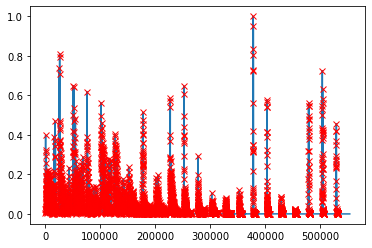

In [41]:
plt.plot(nov) 
plt.plot(peaks,nov[peaks],'x',c='r')

In [42]:
#peaks = np.round(peaks*scale_factor*256, dtype=int)
peaks = np.int32(np.around(peaks*scale_factor*256*2))

In [43]:
peaks.size

5498

In [44]:
max(np.arange(x.size))

970199

IndexError: index 987253 is out of bounds for axis 0 with size 970200

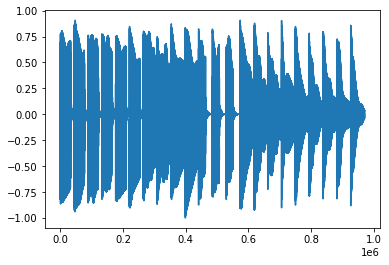

In [45]:
plt.plot(x)
plt.plot(peaks,x[peaks],'x',c='r')

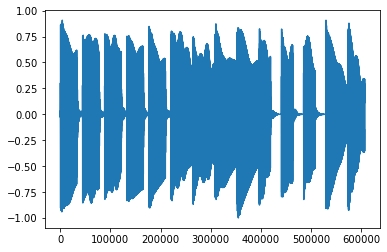

In [46]:
plt.plot(x[peaks[0]:peaks[12]])

In [47]:
x.size

970200

In [56]:
import librosa
o = librosa.onset.onset_detect(x, sr=44100, hop_length=256, backtrack=True, units='samples')

In [49]:
o.size

25

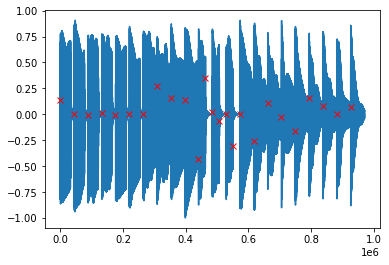

In [59]:
plt.plot(x)
plt.plot(o,x[o],'x',c='r')

In [58]:
o.shape[0]

25